In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [178]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score,r2_score
from scipy.optimize import minimize
from sklearn.metrics import mean_squared_error, accuracy_score, roc_auc_score

In [20]:
from pandas.api.types import is_string_dtype,is_numeric_dtype
from scipy.stats import shapiro
from scipy import stats
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm
from sklearn.model_selection import train_test_split

In [21]:
df_train = pd.read_csv('train_model_data.csv')
df_test = pd.read_csv('test_model_data.csv')

In [22]:
pd.reset_option('display.float_format')

In [23]:
df_train.head()

,Id,SalePrice,Neighborhood,Condition1,Utilities,LandContour,OverallQual,GarageQual,PoolQC,ProximityToITHub,...,BldgType,HouseStyle,OverallCond,SwimmingPool,CinemaHallProximity,PubProximity,HighSchoolProximity,IntermediateSchoolProximity,UGCollegeProximity,PGCollegeProximity
0,1,8206682,Gurgaon,Adjacent to Metro,24/7,Flood-prone,Tata,Low,Good,Yes,...,Single-family,Two-story,8,No,1,2,3,1,4,3
1,2,9261038,Bandra,Adjacent to Metro,24/7,Flood-prone,Sobha,Low,Good,Yes,...,Single-family,Ranch,8,No,2,1,3,3,1,2
2,3,9345573,Koramangala,2 km from Metro,24/7,Not Flood-prone,Tata,Low,Excellent,Yes,...,Single-family,Ranch,7,No,1,3,3,3,4,3
3,4,9657656,Anna Nagar,1 km from Metro,Tanker-dependent,Flood-prone,DLF,Medium,Excellent,Yes,...,Townhouse,Ranch,7,No,3,2,4,2,1,1
4,5,6099072,Koramangala,1 km from Metro,24/7,Not Flood-prone,Tata,Medium,Excellent,Yes,...,Townhouse,Two-story,5,No,2,3,2,1,2,3


In [24]:
df_test.head()

,Id,SalePrice,Neighborhood,Condition1,Utilities,LandContour,OverallQual,GarageQual,PoolQC,ProximityToITHub,...,BldgType,HouseStyle,OverallCond,SwimmingPool,CinemaHallProximity,PubProximity,HighSchoolProximity,IntermediateSchoolProximity,UGCollegeProximity,PGCollegeProximity
0,2321,7741013,Gurgaon,1 km from Metro,24/7,Flood-prone,DLF,Medium,Excellent,No,...,Townhouse,Two-story,5,Yes,4,3,1,4,1,3
1,2322,7556689,Anna Nagar,2 km from Metro,Tanker-dependent,Not Flood-prone,Tata,High,Fair,Yes,...,Single-family,Ranch,9,Yes,3,3,3,3,3,2
2,2323,8515300,Bandra,1 km from Metro,Tanker-dependent,Not Flood-prone,Local Builder,Low,Excellent,No,...,Single-family,Two-story,5,No,4,4,4,4,2,4
3,2324,11978155,Bandra,2 km from Metro,24/7,Flood-prone,Local Builder,High,Fair,Yes,...,Townhouse,Two-story,8,Yes,4,2,1,4,2,4
4,2325,10369776,Bandra,2 km from Metro,Tanker-dependent,Not Flood-prone,Tata,High,Fair,No,...,Townhouse,Ranch,4,No,4,4,1,4,1,3


In [25]:
df_train.shape

(2320, 77)

In [26]:
df_test.shape

(580, 77)

In [27]:
df_train.dtypes

,0
Id,int64
SalePrice,int64
Neighborhood,object
Condition1,object
Utilities,object
...,...
PubProximity,int64
HighSchoolProximity,int64
IntermediateSchoolProximity,int64
UGCollegeProximity,int64


In [28]:
df_train = df_train.drop('Id',axis=1)
df_test = df_test.drop('Id',axis=1)

In [29]:
df_train.describe()

,SalePrice,SchoolProximity,HospitalProximity,GrLivArea,GarageCars,BedroomAbvGr,FullBath,HalfBath,BsmtFinSF1,BsmtFinSF2,...,MasVnrArea,KitchenAbvGr,LotSize,OverallCond,CinemaHallProximity,PubProximity,HighSchoolProximity,IntermediateSchoolProximity,UGCollegeProximity,PGCollegeProximity
count,2.320000e+03,2320.00000,2320.000000,2320.000000,2320.000000,2320.000000,2320.000000,2320.000000,2320.000000,2320.000000,...,2320.000000,2320.000000,2320.000000,2320.000000,2320.000000,2320.000000,2320.000000,2320.000000,2320.000000,2320.000000
mean,1.051930e+07,2.49569,3.494828,1999.017241,1.975862,3.518534,2.024569,0.490086,508.311638,249.853879,...,507.548276,1.486207,9977.160776,4.962931,2.447845,2.552155,2.481466,2.507328,2.518534,2.553448
std,2.639143e+06,1.12250,1.132822,579.495806,0.825595,1.113096,0.822705,0.500009,290.309886,144.553151,...,287.304652,0.499917,2923.825671,2.591392,1.117058,1.116672,1.131920,1.113614,1.126574,1.106914
min,6.008993e+06,1.00000,2.000000,1000.000000,1.000000,2.000000,1.000000,0.000000,0.000000,0.000000,...,0.000000,1.000000,5000.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,8.196896e+06,1.00000,2.000000,1477.000000,1.000000,3.000000,1.000000,0.000000,254.000000,117.000000,...,268.750000,1.000000,7384.250000,3.000000,1.000000,2.000000,1.000000,2.000000,2.000000,2.000000
50%,1.055310e+07,3.00000,3.500000,2009.000000,2.000000,4.000000,2.000000,0.000000,511.500000,249.000000,...,512.500000,1.000000,9930.500000,5.000000,2.000000,3.000000,2.000000,3.000000,3.000000,3.000000
75%,1.281371e+07,3.00000,5.000000,2498.000000,3.000000,5.000000,3.000000,1.000000,760.250000,376.250000,...,758.000000,2.000000,12509.750000,7.000000,3.000000,4.000000,3.250000,3.000000,4.000000,4.000000
max,1.499425e+07,4.00000,5.000000,2999.000000,3.000000,5.000000,3.000000,1.000000,999.000000,499.000000,...,999.000000,2.000000,14999.000000,9.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000


In [30]:
df_test.describe()

,SalePrice,SchoolProximity,HospitalProximity,GrLivArea,GarageCars,BedroomAbvGr,FullBath,HalfBath,BsmtFinSF1,BsmtFinSF2,...,MasVnrArea,KitchenAbvGr,LotSize,OverallCond,CinemaHallProximity,PubProximity,HighSchoolProximity,IntermediateSchoolProximity,UGCollegeProximity,PGCollegeProximity
count,5.800000e+02,580.000000,580.000000,580.000000,580.000000,580.000000,580.000000,580.000000,580.000000,580.000000,...,580.00000,580.000000,580.00000,580.000000,580.000000,580.000000,580.000000,580.000000,580.000000,580.000000
mean,1.047002e+07,2.472414,3.584483,2010.422414,2.003448,3.501724,2.020690,0.468966,495.456897,247.213793,...,492.57931,1.494828,9969.92069,5.053448,2.496552,2.462069,2.408621,2.525862,2.484483,2.513793
std,2.561398e+06,1.150624,1.121974,585.694863,0.816489,1.084510,0.820455,0.499467,284.104088,147.346404,...,295.06292,0.500405,2878.44466,2.461217,1.120536,1.127583,1.087023,1.134033,1.101781,1.114274
min,6.034608e+06,1.000000,2.000000,1000.000000,1.000000,2.000000,1.000000,0.000000,2.000000,0.000000,...,0.00000,1.000000,5009.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,8.285444e+06,1.000000,3.000000,1476.250000,1.000000,3.000000,1.000000,0.000000,263.000000,115.750000,...,220.75000,1.000000,7368.75000,3.000000,1.000000,1.000000,1.000000,1.000000,2.000000,2.000000
50%,1.041949e+07,2.000000,4.000000,2043.000000,2.000000,4.000000,2.000000,0.000000,489.500000,244.500000,...,487.50000,1.000000,10025.50000,5.000000,3.000000,2.000000,2.000000,3.000000,2.000000,3.000000
75%,1.252887e+07,4.000000,5.000000,2515.250000,3.000000,4.000000,3.000000,1.000000,744.000000,375.250000,...,748.50000,2.000000,12523.00000,7.000000,3.000000,4.000000,3.000000,4.000000,3.000000,3.000000
max,1.499278e+07,4.000000,5.000000,2995.000000,3.000000,5.000000,3.000000,1.000000,996.000000,499.000000,...,994.00000,2.000000,14985.00000,9.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000


In [31]:
df_train.describe(include='object')

,Neighborhood,Condition1,Utilities,LandContour,OverallQual,GarageQual,PoolQC,ProximityToITHub,PublicTransportAccessibility,AirQuality,...,KitchenQual,PavedDrive,Street,Alley,LotShape,LotConfig,LandSlope,BldgType,HouseStyle,SwimmingPool
count,2320,2320,2320,2320,2320,2320,2320,2320,2320,2320,...,2320,2320,2320,2320,2320,2320,2320,2320,2320,2320
unique,4,3,2,2,4,3,3,2,3,3,...,3,2,2,2,2,3,3,2,2,2
top,Koramangala,Adjacent to Metro,24/7,Not Flood-prone,Local Builder,Medium,Good,No,Low,Fair,...,Fair,Yes,Gravel,Paved,Regular,Inside,Gentle,Townhouse,Ranch,Yes
freq,604,798,1185,1177,596,796,790,1190,791,781,...,832,1187,1186,1166,1167,811,816,1176,1169,1165


In [32]:
df_test.describe(include='object')

,Neighborhood,Condition1,Utilities,LandContour,OverallQual,GarageQual,PoolQC,ProximityToITHub,PublicTransportAccessibility,AirQuality,...,KitchenQual,PavedDrive,Street,Alley,LotShape,LotConfig,LandSlope,BldgType,HouseStyle,SwimmingPool
count,580,580,580,580,580,580,580,580,580,580,...,580,580,580,580,580,580,580,580,580,580
unique,4,3,2,2,4,3,3,2,3,3,...,3,2,2,2,2,3,3,2,2,2
top,Anna Nagar,2 km from Metro,24/7,Not Flood-prone,Local Builder,High,Fair,No,Medium,Fair,...,Good,Yes,Gravel,Paved,Regular,Corner,Severe,Single-family,Two-story,No
freq,159,210,293,293,161,212,209,310,217,201,...,201,303,296,301,291,217,206,292,290,301


In [33]:
numeric_features_train = df_train.select_dtypes(include=np.number)
numeric_features_train

,SalePrice,SchoolProximity,HospitalProximity,GrLivArea,GarageCars,BedroomAbvGr,FullBath,HalfBath,BsmtFinSF1,BsmtFinSF2,...,MasVnrArea,KitchenAbvGr,LotSize,OverallCond,CinemaHallProximity,PubProximity,HighSchoolProximity,IntermediateSchoolProximity,UGCollegeProximity,PGCollegeProximity
0,8206682,3,2,2957,2,3,3,0,873,415,...,229,2,10281,8,1,2,3,1,4,3
1,9261038,1,4,1093,3,5,2,1,508,157,...,442,2,9817,8,2,1,3,3,1,2
2,9345573,1,2,1768,1,4,3,1,414,284,...,572,2,13155,7,1,3,3,3,4,3
3,9657656,4,2,1836,2,2,3,0,529,340,...,234,2,8762,7,3,2,4,2,1,1
4,6099072,2,2,1222,1,3,2,0,655,459,...,390,1,6496,5,2,3,2,1,2,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2315,10862931,1,5,2876,1,5,1,0,936,250,...,641,1,13619,8,4,4,3,4,1,2
2316,6473098,3,5,1364,1,2,3,0,518,182,...,846,1,7558,3,4,3,4,2,2,2
2317,7124638,2,3,2298,2,5,2,0,601,219,...,905,1,12512,9,1,1,2,3,4,4
2318,6854276,2,5,2363,1,4,3,0,421,275,...,42,2,14412,7,2,1,4,1,3,3


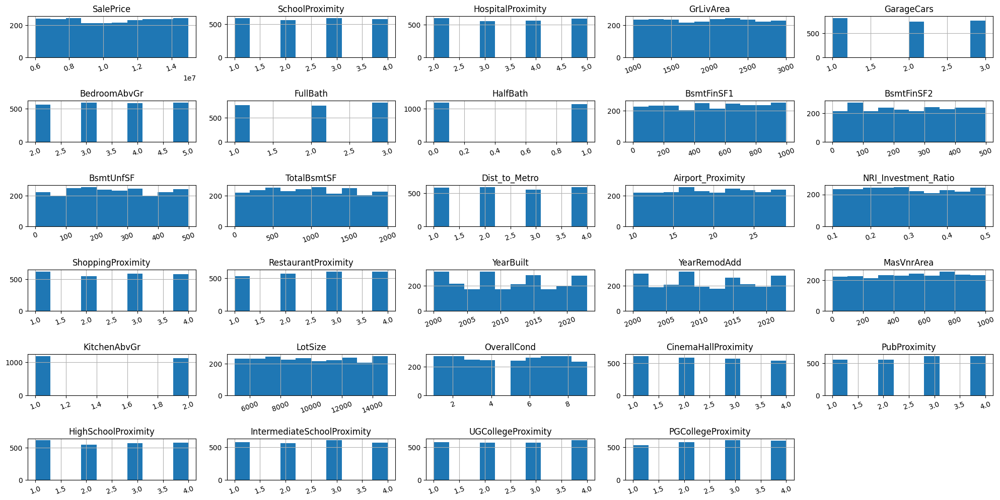

In [34]:
df_train.hist(xrot=20, figsize=(20, 10))

# adjust the subplots
plt.tight_layout()

# display the plot
plt.show()

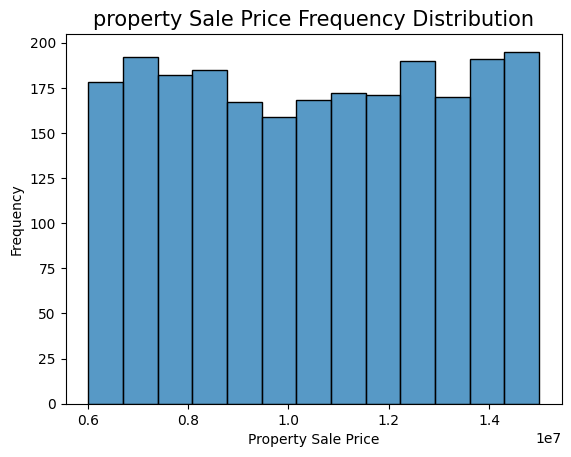

In [35]:
# Sale Price Frequency Distribution
sns.histplot(df_train['SalePrice'])
# set the xlabel and the fontsize
plt.xlabel('Property Sale Price',fontsize=10)

# set the ylabel and the fontsize
plt.ylabel('Frequency',fontsize=10)


# set the title of the plot
plt.title('property Sale Price Frequency Distribution',fontsize=15)


# plot the histogram for the target variable
plt.show()

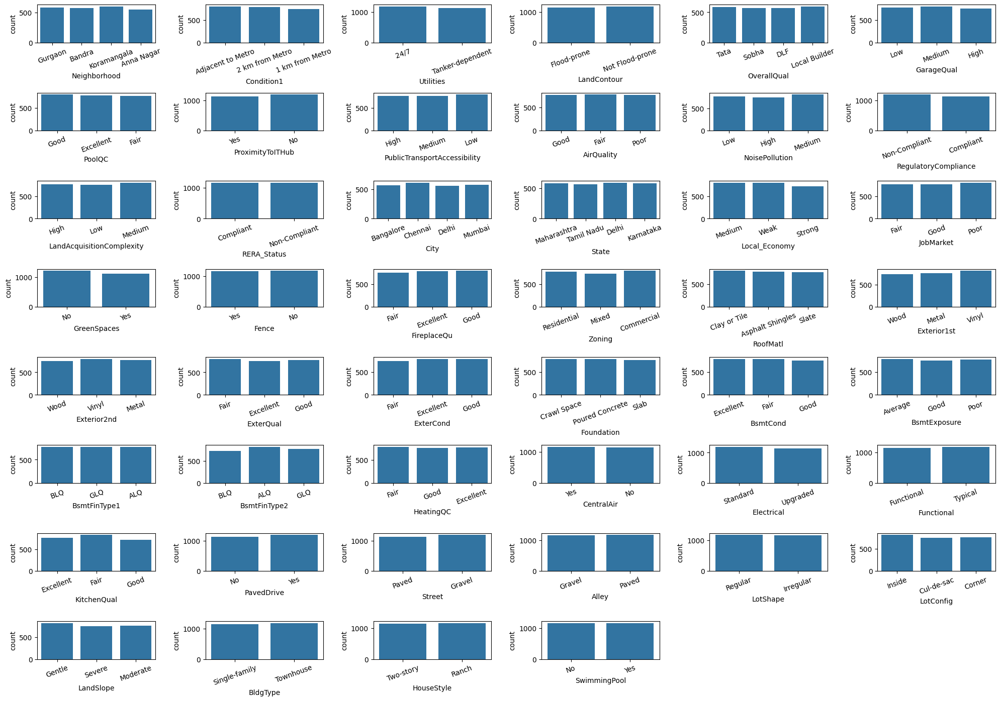

In [36]:
# create an empty list to store all the categorical variables
categorical= []

# check the data type of each variable
for i in df_train.columns:

    # check if the variable has the categorical type
  if is_string_dtype(df_train[i]):

        # append the categorical variables to the list 'categorical'
    categorical.append(i)
# plot the count plot for each categorical variable
# 'figsize' sets the figure size
plt.figure(figsize=(20,80))

# plot the count plot using countplot() for each categorical variable
for i,col in enumerate(categorical,1):
    plt.subplot(len(categorical),6,i)
    sns.countplot(data=df_train,x=col)
    plt.xticks(rotation=20)

plt.tight_layout()



# display the plot
plt.show()

In [37]:
# Pairplot of numeric variables
# select the columns for the pairplot
numeric_cols = numeric_features_train.columns

# draw the pairplot such that the diagonal should be density plot and the other graphs should be scatter plot
sns.pairplot(data = df_train[numeric_cols], diag_kind = 'kde',kind = 'scatter')

# display the plot
plt.show()

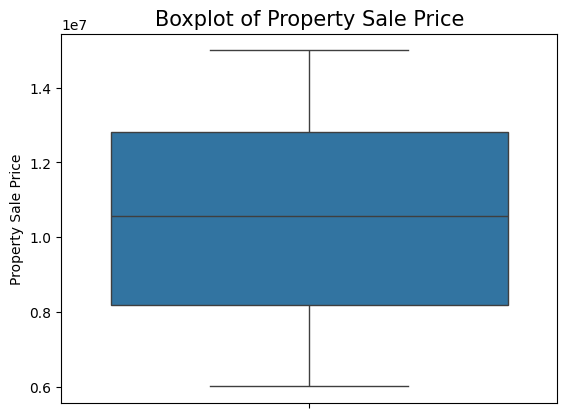

In [38]:
# plot a boxplot of target variable to detect the outliers
sns.boxplot(data=df_train,y='SalePrice')
# set plot label
# set text size using 'fontsize'
plt.ylabel('Property Sale Price',fontsize=10)
plt.title('Boxplot of Property Sale Price',fontsize=15)

# display the plot
plt.show()

In [39]:
numeric_features_test = df_test.select_dtypes(include=np.number)
numeric_features_test

,SalePrice,SchoolProximity,HospitalProximity,GrLivArea,GarageCars,BedroomAbvGr,FullBath,HalfBath,BsmtFinSF1,BsmtFinSF2,...,MasVnrArea,KitchenAbvGr,LotSize,OverallCond,CinemaHallProximity,PubProximity,HighSchoolProximity,IntermediateSchoolProximity,UGCollegeProximity,PGCollegeProximity
0,7741013,2,5,1261,1,5,1,1,122,483,...,374,1,5858,5,4,3,1,4,1,3
1,7556689,2,3,1341,3,2,3,0,541,58,...,638,1,12629,9,3,3,3,3,3,2
2,8515300,1,4,1354,3,4,1,0,597,487,...,711,2,9898,5,4,4,4,4,2,4
3,11978155,4,4,1110,2,3,3,0,889,96,...,747,1,10130,8,4,2,1,4,2,4
4,10369776,3,3,2741,2,5,2,0,881,226,...,459,2,9383,4,4,4,1,4,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
575,9045723,4,4,1244,3,4,2,1,96,373,...,386,1,14896,9,2,1,1,3,1,2
576,10602333,1,5,2068,3,2,2,0,361,193,...,418,2,6628,8,4,2,2,2,3,3
577,12588282,2,2,2514,2,3,2,0,769,8,...,801,1,11198,9,4,2,3,2,3,3
578,12689532,2,2,2670,2,4,1,1,469,366,...,334,2,6778,2,4,2,2,1,4,3


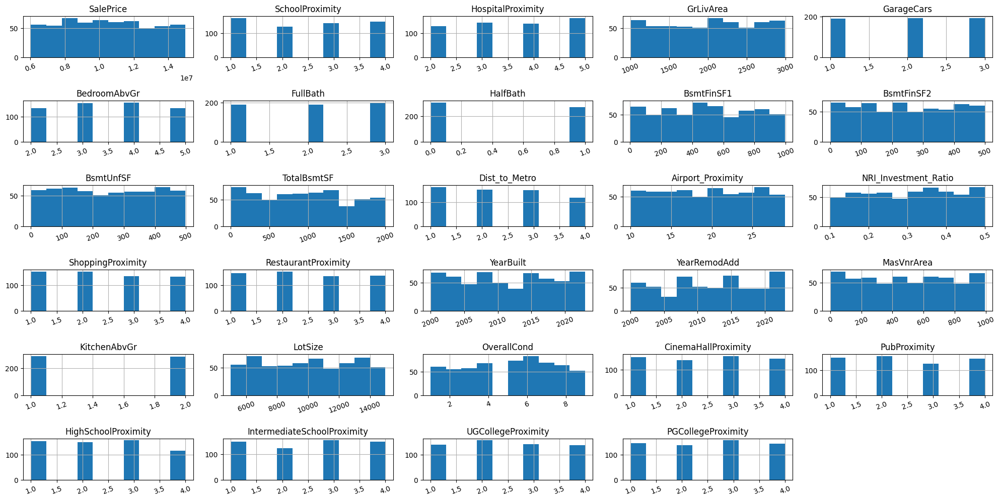

In [40]:
df_test.hist(xrot=20, figsize=(20, 10))

# adjust the subplots
plt.tight_layout()

# display the plot
plt.show()

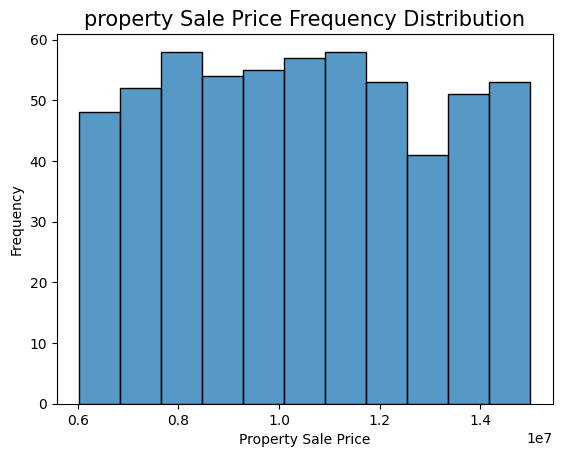

In [41]:
# Sale Price Frequency Distribution
sns.histplot(df_test['SalePrice'])
# set the xlabel and the fontsize
plt.xlabel('Property Sale Price',fontsize=10)

# set the ylabel and the fontsize
plt.ylabel('Frequency',fontsize=10)


# set the title of the plot
plt.title('property Sale Price Frequency Distribution',fontsize=15)


# plot the histogram for the target variable
plt.show()

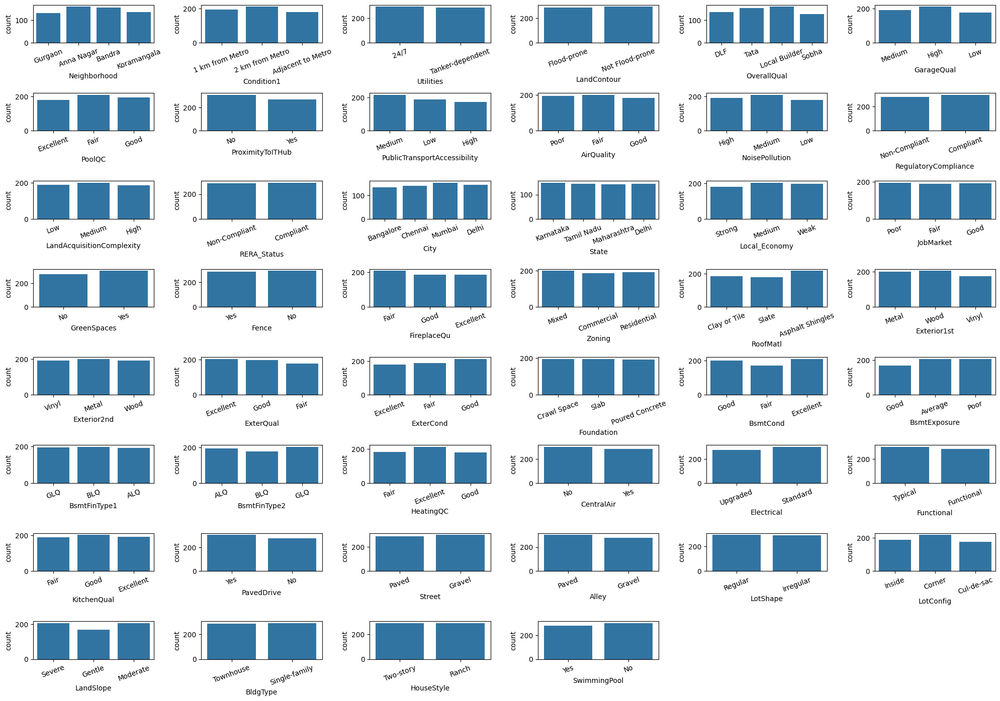

In [42]:
# create an empty list to store all the categorical variables
categorical= []

# check the data type of each variable
for i in df_test.columns:

    # check if the variable has the categorical type
  if is_string_dtype(df_test[i]):

        # append the categorical variables to the list 'categorical'
    categorical.append(i)
# plot the count plot for each categorical variable
# 'figsize' sets the figure size
plt.figure(figsize=(20,80))

# plot the count plot using countplot() for each categorical variable
for i,col in enumerate(categorical,1):
    plt.subplot(len(categorical),6,i)
    sns.countplot(data=df_test,x=col)
    plt.xticks(rotation=20)

plt.tight_layout()



# display the plot
plt.show()

In [43]:
df_train.isnull().sum().sort_values(ascending=False)

,0
MasVnrType,746
SalePrice,0
Condition1,0
Neighborhood,0
LandContour,0
...,...
PubProximity,0
HighSchoolProximity,0
IntermediateSchoolProximity,0
UGCollegeProximity,0


In [44]:
df_train['MasVnrType'] = df_train['MasVnrType'].fillna('None')

In [45]:
df_train.isnull().sum().sort_values(ascending=False)


,0
SalePrice,0
Neighborhood,0
Condition1,0
Utilities,0
LandContour,0
...,...
PubProximity,0
HighSchoolProximity,0
IntermediateSchoolProximity,0
UGCollegeProximity,0


In [46]:
df_test.isnull().sum().sort_values(ascending=False)

,0
MasVnrType,196
SalePrice,0
Condition1,0
Neighborhood,0
LandContour,0
...,...
PubProximity,0
HighSchoolProximity,0
IntermediateSchoolProximity,0
UGCollegeProximity,0


In [47]:
df_test['MasVnrType'] = df_test['MasVnrType'].fillna('None')

In [48]:
df_test.isnull().sum().sort_values(ascending=False)

,0
SalePrice,0
Neighborhood,0
Condition1,0
Utilities,0
LandContour,0
...,...
PubProximity,0
HighSchoolProximity,0
IntermediateSchoolProximity,0
UGCollegeProximity,0


Text(0.5, 1.0, 'Correlation Heatmap')

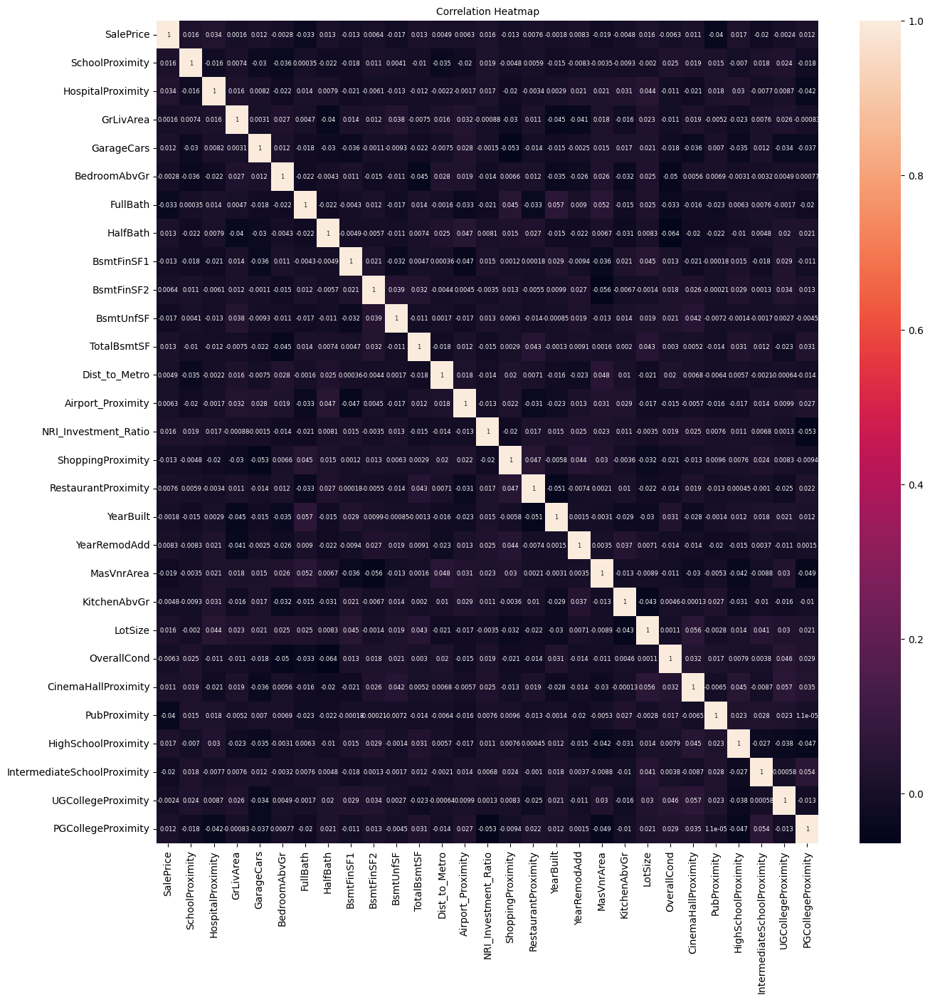

In [49]:
# create a figure with specified size
plt.figure(figsize=(15,15))

# draw a heatmap showing correlation between numeric features
sns.heatmap(numeric_features_train.corr(), annot=True, annot_kws={'fontsize':6})

# set font size for x and y axis tick labels
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# set the title of the heatmap
plt.title('correlation heatmap', fontsize=10)


In [50]:
# compute quantiles
quantile_levels = [0.01, 0.25, 0.5, 0.75, 0.99]

quantiles = df_train[numeric_cols].quantile(quantile_levels).T

print("\nQuantile Analysis:")
print(quantiles)



Quantile Analysis:
                                     0.01          0.25          0.50  \
SalePrice                    6.093893e+06  8.196896e+06  1.055310e+07   
SchoolProximity              1.000000e+00  1.000000e+00  3.000000e+00   
HospitalProximity            2.000000e+00  2.000000e+00  3.500000e+00   
GrLivArea                    1.020000e+03  1.477000e+03  2.009000e+03   
GarageCars                   1.000000e+00  1.000000e+00  2.000000e+00   
BedroomAbvGr                 2.000000e+00  3.000000e+00  4.000000e+00   
FullBath                     1.000000e+00  1.000000e+00  2.000000e+00   
HalfBath                     0.000000e+00  0.000000e+00  0.000000e+00   
BsmtFinSF1                   1.119000e+01  2.540000e+02  5.115000e+02   
BsmtFinSF2                   6.000000e+00  1.170000e+02  2.490000e+02   
BsmtUnfSF                    4.000000e+00  1.310000e+02  2.480000e+02   
TotalBsmtSF                  2.019000e+01  4.980000e+02  9.840000e+02   
Dist_to_Metro                1.

In [51]:
quantiles.columns = ['Q01', 'Q25', 'Q50', 'Q75', 'Q99']
quantiles['IQR'] = quantiles['Q75'] - quantiles['Q25']

# reset index for nice display
quantile_summary = quantiles.reset_index().rename(columns={'index': 'Feature'})

quantile_summary

,Feature,Q01,Q25,Q50,Q75,Q99,IQR
0,SalePrice,6.093893e+06,8.196896e+06,1.055310e+07,1.281371e+07,1.491137e+07,4.616811e+06
1,SchoolProximity,1.000000e+00,1.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,2.000000e+00
2,HospitalProximity,2.000000e+00,2.000000e+00,3.500000e+00,5.000000e+00,5.000000e+00,3.000000e+00
3,GrLivArea,1.020000e+03,1.477000e+03,2.009000e+03,2.498000e+03,2.981000e+03,1.021000e+03
4,GarageCars,1.000000e+00,1.000000e+00,2.000000e+00,3.000000e+00,3.000000e+00,2.000000e+00
5,BedroomAbvGr,2.000000e+00,3.000000e+00,4.000000e+00,5.000000e+00,5.000000e+00,2.000000e+00
6,FullBath,1.000000e+00,1.000000e+00,2.000000e+00,3.000000e+00,3.000000e+00,2.000000e+00
7,HalfBath,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
8,BsmtFinSF1,1.119000e+01,2.540000e+02,5.115000e+02,7.602500e+02,9.890000e+02,5.062500e+02
9,BsmtFinSF2,6.000000e+00,1.170000e+02,2.490000e+02,3.762500e+02,4.950000e+02,2.592500e+02


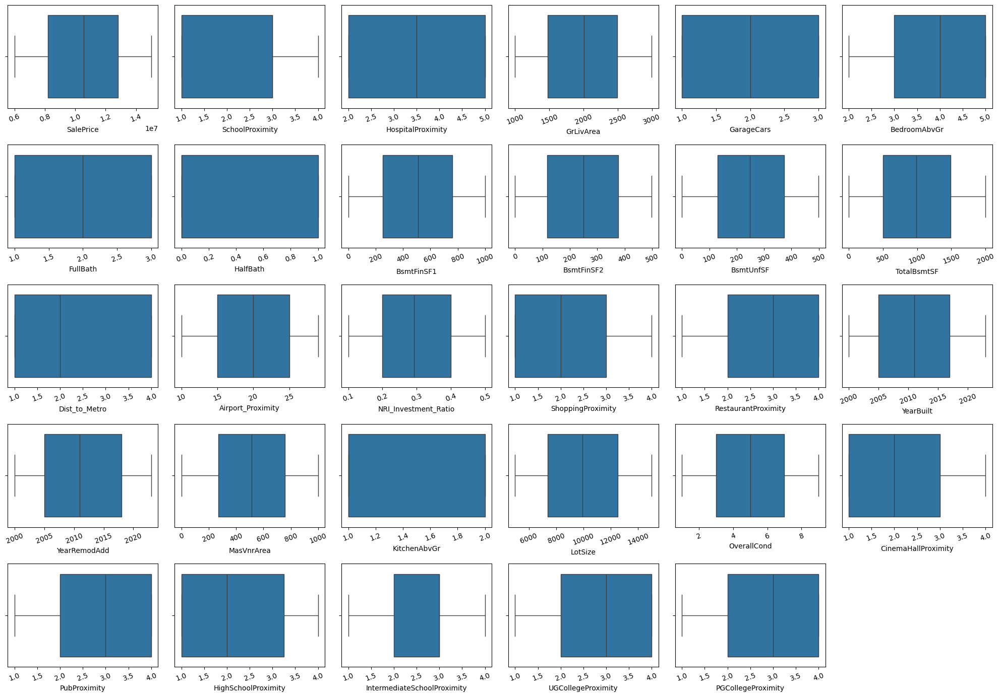

In [52]:
# create a figure with specified size
plt.figure(figsize=(20,80))

# loop through each numeric column and create a boxplot
for i, col in enumerate(numeric_cols, 1):
    plt.subplot(len(numeric_cols), 6, i)  # arrange subplots in a grid
    sns.boxplot(data=df_train, x=col)     # draw boxplot for each column
    plt.xticks(rotation=20)               # rotate x-axis labels for better visibility

# adjust layout to prevent overlapping
plt.tight_layout()


In [53]:
# shapiro() returns the the test statistics along with the p-value of the test
stats,p = shapiro(df_train['SalePrice'])

# print the numeric outputs of the Shapiro-Wilk test upto 3 decimal places
print('stats:%.3f,p value:%.3f' %(stats,p))

# set the level of significance (alpha) to 0.05
alpha = 0.05

# if the p-value is less than alpha print we reject alpha
# if the p-value is greater than alpha print we accept alpha
if p > alpha:
    print('We accept the alpha, this data is normally distributed')
else:
    print('We reject the alpha, this data is not normally distributed')

stats:0.950,p value:0.000
We reject the alpha, this data is not normally distributed


In [54]:
# log transformation using np.log()
df_train['log_Sale_Price'] = np.log(df_train['SalePrice'])
# display the top 5 rows of the data
df_train.head()

,SalePrice,Neighborhood,Condition1,Utilities,LandContour,OverallQual,GarageQual,PoolQC,ProximityToITHub,PublicTransportAccessibility,...,HouseStyle,OverallCond,SwimmingPool,CinemaHallProximity,PubProximity,HighSchoolProximity,IntermediateSchoolProximity,UGCollegeProximity,PGCollegeProximity,log_Sale_Price
0,8206682,Gurgaon,Adjacent to Metro,24/7,Flood-prone,Tata,Low,Good,Yes,High,...,Two-story,8,No,1,2,3,1,4,3,15.920459
1,9261038,Bandra,Adjacent to Metro,24/7,Flood-prone,Sobha,Low,Good,Yes,Medium,...,Ranch,8,No,2,1,3,3,1,2,16.041327
2,9345573,Koramangala,2 km from Metro,24/7,Not Flood-prone,Tata,Low,Excellent,Yes,High,...,Ranch,7,No,1,3,3,3,4,3,16.050413
3,9657656,Anna Nagar,1 km from Metro,Tanker-dependent,Flood-prone,DLF,Medium,Excellent,Yes,High,...,Ranch,7,No,3,2,4,2,1,1,16.083262
4,6099072,Koramangala,1 km from Metro,24/7,Not Flood-prone,Tata,Medium,Excellent,Yes,High,...,Two-story,5,No,2,3,2,1,2,3,15.623647


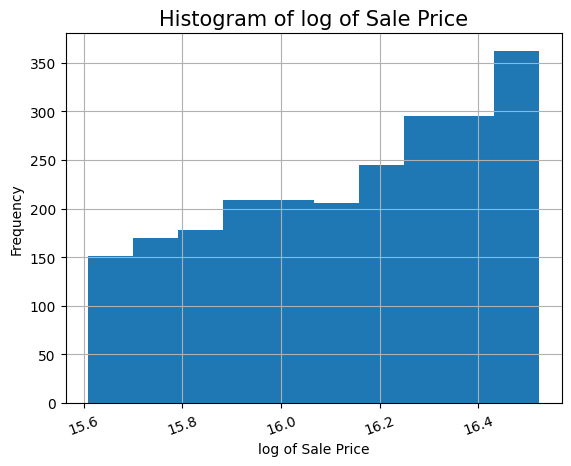

In [55]:
# recheck for normality
# plot the histogram using hist
df_train.log_Sale_Price.hist(xrot=20)
# add plot and axes labels
# set text size using 'fontsize'
plt.xlabel('log of Sale Price',fontsize=10)
plt.ylabel('Frequency',fontsize=10)
plt.title('Histogram of log of Sale Price',fontsize=15)
# display the plot
plt.show()

In [56]:
# shapiro() returns the the test statistics along with the p-value of the test
stats,p = shapiro(df_train['log_Sale_Price'])
# print the numeric outputs of the Shapiro-Wilk test upto 3 decimal places
print('stats:%.3f,p value:%.3f' %(stats,p))
# set the level of significance (alpha) to 0.05
alpha=0.05
# if the p-value is less than alpha print we reject alpha
# if the p-value is greater than alpha print we accept alpha
if p > alpha:
    print('We accept the alpha, this data is normally distributed')
else:
    print('We reject the alpha, this data is not normally distributed')

stats:0.944,p value:0.000
We reject the alpha, this data is not normally distributed


In [57]:
df_train.log_Sale_Price.skew()

np.float64(-0.307960619565996)

In [58]:
# create an empty dataframe to store vif values
vif_data = pd.DataFrame()

# store feature names excluding the target variable
vif_data['features'] = numeric_features_train.drop('SalePrice', axis=1).columns

# calculate vif for each feature
vif_data['VIF'] = [
    variance_inflation_factor(numeric_features_train.drop('SalePrice', axis=1).values, i)
    for i in range(len(numeric_features_train.drop('SalePrice', axis=1).columns))
]

# display the vif data
print(vif_data)


                       features           VIF
0               SchoolProximity      5.990859
1             HospitalProximity     10.632660
2                     GrLivArea     13.021763
3                    GarageCars      6.827267
4                  BedroomAbvGr     11.123486
5                      FullBath      7.163905
6                      HalfBath      1.990672
7                    BsmtFinSF1      4.123441
8                    BsmtFinSF2      4.029942
9                     BsmtUnfSF      4.093971
10                  TotalBsmtSF      4.038522
11                Dist_to_Metro      5.992346
12            Airport_Proximity     12.946596
13         NRI_Investment_Ratio      7.715650
14            ShoppingProximity      5.892582
15          RestaurantProximity      6.385733
16                    YearBuilt  42320.700597
17                 YearRemodAdd  42433.070775
18                   MasVnrArea      4.203189
19                 KitchenAbvGr      9.966719
20                      LotSize   

In [59]:
# we will calculate the VIF for each numerical variable
while True:
    # create an empty dataframe
    vif_table = pd.DataFrame(columns = ['Features', 'VIF_Factor'])
    # calculate VIF for each variable and create a column 'VIF_Factor' to store the values
    vif_table['VIF_Factor'] = [variance_inflation_factor(numeric_features_train.drop('SalePrice',axis=1).values, i) for i in range(numeric_features_train.drop('SalePrice',axis=1).shape[1])]
    # create a column of feature names
    vif_table['Features']=numeric_features_train.drop('SalePrice',axis=1).columns
    # filter the variables with VIF greater than 10 and store it in a dataframe 'vif_more_than_10'
    # one can choose the threshold other than 10 (it depends on the business requirements)
    vif_more_than_10 = vif_table[vif_table['VIF_Factor']>10]
    # if dataframe 'vif_more_than_10' is not empty, then sort the dataframe by VIF values
    # if dataframe 'vif_more_than_10' is empty (i.e. all VIF <= 10), then print the dataframe 'vif' and break the for loop using 'break'
    # 'by' sorts the data using given variable(s)
    # 'ascending = False' sorts the data in descending order
    if vif_more_than_10.empty:
      print(vif_table.sort_values(by = 'VIF_Factor', ascending = False).reset_index(drop = True))
      break
    else:
      vif_more_than_10 = vif_more_than_10.sort_values(by = 'VIF_Factor', ascending = False).reset_index(drop = True)
    # if  dataframe 'df_sorted' is not empty, then drop the first entry in the column 'Features' from the numeric variables
    # select the variable using 'iloc[]'
    # 'axis=1' drops the corresponding column
    #  else print the final dataframe 'vif' with all values after removal of variables with VIF less than 10
    col=vif_more_than_10.iloc[0,0]
    numeric_features_train.drop([col],axis=1,inplace=True)
    numeric_features_test.drop([col],axis=1,inplace=True)

                       Features  VIF_Factor
0                  BedroomAbvGr    9.981217
1             HospitalProximity    9.720875
2                  KitchenAbvGr    9.161713
3          NRI_Investment_Ratio    7.306392
4                      FullBath    6.698860
5                    GarageCars    6.310264
6           RestaurantProximity    6.131630
7            PGCollegeProximity    6.051547
8                  PubProximity    6.045802
9   IntermediateSchoolProximity    5.900296
10           UGCollegeProximity    5.877479
11                Dist_to_Metro    5.769490
12          CinemaHallProximity    5.717486
13              SchoolProximity    5.688473
14            ShoppingProximity    5.659568
15          HighSchoolProximity    5.633400
16                  OverallCond    4.602145
17                   MasVnrArea    4.101001
18                   BsmtFinSF1    3.976739
19                    BsmtUnfSF    3.974985
20                   BsmtFinSF2    3.958706
21                  TotalBsmtSF 

In [60]:
numeric_features_train.shape

(2320, 24)

In [61]:
numeric_features_train.columns

Index(['SalePrice', 'SchoolProximity', 'HospitalProximity', 'GarageCars',
       'BedroomAbvGr', 'FullBath', 'HalfBath', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtUnfSF', 'TotalBsmtSF', 'Dist_to_Metro', 'NRI_Investment_Ratio',
       'ShoppingProximity', 'RestaurantProximity', 'MasVnrArea',
       'KitchenAbvGr', 'OverallCond', 'CinemaHallProximity', 'PubProximity',
       'HighSchoolProximity', 'IntermediateSchoolProximity',
       'UGCollegeProximity', 'PGCollegeProximity'],
      dtype='object')

In [62]:
numeric_features_test.shape

(580, 24)

In [63]:
categorical_features_train = df_train.select_dtypes(include=object)
# display the categorical features
categorical_features_train.columns

Index(['Neighborhood', 'Condition1', 'Utilities', 'LandContour', 'OverallQual',
       'GarageQual', 'PoolQC', 'ProximityToITHub',
       'PublicTransportAccessibility', 'AirQuality', 'NoisePollution',
       'RegulatoryCompliance', 'LandAcquisitionComplexity', 'RERA_Status',
       'City', 'State', 'Local_Economy', 'JobMarket', 'GreenSpaces', 'Fence',
       'FireplaceQu', 'Zoning', 'RoofMatl', 'Exterior1st', 'Exterior2nd',
       'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtCond',
       'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'HeatingQC',
       'CentralAir', 'Electrical', 'Functional', 'KitchenQual', 'PavedDrive',
       'Street', 'Alley', 'LotShape', 'LotConfig', 'LandSlope', 'BldgType',
       'HouseStyle', 'SwimmingPool'],
      dtype='object')

In [64]:
categorical_features_train.shape

(2320, 47)

In [65]:
categorical_features_test = df_test.select_dtypes(include=object)
categorical_features_test.shape

(580, 47)

In [66]:
# convert categorical features to dummy variables, drop first to avoid multicollinearity
dummy_features_train = pd.get_dummies(categorical_features_train, drop_first=True, dtype=int)

# combine numeric and dummy features into a single dataframe
df_dummy_train = pd.concat([numeric_features_train, dummy_features_train], axis=1)

# display the first few rows of the combined dataframe
df_dummy_train.head()


,SalePrice,SchoolProximity,HospitalProximity,GarageCars,BedroomAbvGr,FullBath,HalfBath,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,...,Street_Paved,Alley_Paved,LotShape_Regular,LotConfig_Cul-de-sac,LotConfig_Inside,LandSlope_Moderate,LandSlope_Severe,BldgType_Townhouse,HouseStyle_Two-story,SwimmingPool_Yes
0,8206682,3,2,2,3,3,0,873,415,90,...,1,0,1,0,1,0,0,0,1,0
1,9261038,1,4,3,5,2,1,508,157,168,...,1,0,0,1,0,0,0,0,0,0
2,9345573,1,2,1,4,3,1,414,284,127,...,0,1,1,0,1,0,1,0,0,0
3,9657656,4,2,2,2,3,0,529,340,401,...,0,1,1,0,0,0,0,1,0,0
4,6099072,2,2,1,3,2,0,655,459,178,...,1,0,1,0,1,0,0,1,1,0


In [67]:
dummy_features_test = pd.get_dummies(categorical_features_test,drop_first=True,dtype=int)
df_dummy_test = pd.concat([numeric_features_test,dummy_features_test],axis=1)
df_dummy_test.head()

,SalePrice,SchoolProximity,HospitalProximity,GarageCars,BedroomAbvGr,FullBath,HalfBath,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,...,Street_Paved,Alley_Paved,LotShape_Regular,LotConfig_Cul-de-sac,LotConfig_Inside,LandSlope_Moderate,LandSlope_Severe,BldgType_Townhouse,HouseStyle_Two-story,SwimmingPool_Yes
0,7741013,2,5,1,5,1,1,122,483,193,...,1,1,1,0,1,0,1,1,1,1
1,7556689,2,3,3,2,3,0,541,58,402,...,0,1,1,0,0,0,1,0,0,1
2,8515300,1,4,3,4,1,0,597,487,352,...,1,1,1,0,0,0,1,0,1,0
3,11978155,4,4,2,3,3,0,889,96,0,...,0,1,1,0,0,0,0,1,1,1
4,10369776,3,3,2,5,2,0,881,226,260,...,1,1,0,1,0,0,0,1,0,0


In [68]:
# Calculate the 80th percentile of Sale Price
threshold = df_dummy_train["SalePrice"].quantile(0.8)

# Create the "Premium" column (1 if Sale_Price is in top 20%, else 0)
df_dummy_train["Premium"] = (df_dummy_train["SalePrice"] >= threshold).astype(int)

# Display the first few rows
df_dummy_train.head()


,SalePrice,SchoolProximity,HospitalProximity,GarageCars,BedroomAbvGr,FullBath,HalfBath,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,...,Alley_Paved,LotShape_Regular,LotConfig_Cul-de-sac,LotConfig_Inside,LandSlope_Moderate,LandSlope_Severe,BldgType_Townhouse,HouseStyle_Two-story,SwimmingPool_Yes,Premium
0,8206682,3,2,2,3,3,0,873,415,90,...,0,1,0,1,0,0,0,1,0,0
1,9261038,1,4,3,5,2,1,508,157,168,...,0,0,1,0,0,0,0,0,0,0
2,9345573,1,2,1,4,3,1,414,284,127,...,1,1,0,1,0,1,0,0,0,0
3,9657656,4,2,2,2,3,0,529,340,401,...,1,1,0,0,0,0,1,0,0,0
4,6099072,2,2,1,3,2,0,655,459,178,...,0,1,0,1,0,0,1,1,0,0


In [69]:
# Create the "Premium" column (1 if Sale_Price is in top 20%, else 0)
df_dummy_test["Premium"] = (df_dummy_test["SalePrice"] >= threshold).astype(int)

# Display the first few rows
df_dummy_test.head()

,SalePrice,SchoolProximity,HospitalProximity,GarageCars,BedroomAbvGr,FullBath,HalfBath,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,...,Alley_Paved,LotShape_Regular,LotConfig_Cul-de-sac,LotConfig_Inside,LandSlope_Moderate,LandSlope_Severe,BldgType_Townhouse,HouseStyle_Two-story,SwimmingPool_Yes,Premium
0,7741013,2,5,1,5,1,1,122,483,193,...,1,1,0,1,0,1,1,1,1,0
1,7556689,2,3,3,2,3,0,541,58,402,...,1,1,0,0,0,1,0,0,1,0
2,8515300,1,4,3,4,1,0,597,487,352,...,1,1,0,0,0,1,0,1,0,0
3,11978155,4,4,2,3,3,0,889,96,0,...,1,1,0,0,0,0,1,1,1,0
4,10369776,3,3,2,5,2,0,881,226,260,...,1,0,1,0,0,0,1,0,0,0


In [70]:
x_train = df_dummy_train.drop(["Premium","SalePrice"],axis=1)
y_train_reg=df_dummy_train["SalePrice"]
y_train_class=df_dummy_train["Premium"]

In [71]:
x_test = df_dummy_test.drop(["Premium","SalePrice"],axis=1)
y_test_reg=df_dummy_test["SalePrice"]
y_test_class=df_dummy_test["Premium"]

In [72]:
#3.Implement Regularization Techniques: Implement both L1 and L2 regularization in the cost function:
def compute_cost(x, y, w, reg_type=None, lambda_=0.1):
  m = len(y)  # Number of samples
  y_pred = np.dot(x, w)  # Predicted values
  cost = (1 / (2 * m)) * np.sum((y_pred - y) ** 2)  # Standard linear regression cost

  # Add L1 (Lasso) Regularization
  if reg_type == "l1":
      cost += (lambda_) * np.sum(np.abs(w))

  # Add L2 (Ridge) Regularization
  elif reg_type == "l2":
      cost += (lambda_ / 2) * np.dot(w,w.T)

  return cost
#L1 Regularization (Lasso): Adds the absolute value of the coefficients to the cost function, leading to sparsity (some coefficients become zero).
#L2 Regularization (Ridge): Adds the square of the coefficients to the cost function, discouraging large weights but not forcing them to zero.

In [73]:
def compute_gradient(x,y,w,reg_type=None,lambda_=0.1):
  m=len(y)
  y_pred=np.dot(x,w)
  gradient=(1/m)*np.dot(x.T,(y_pred-y))
  # Apply L1 (Lasso) Regularization
  if reg_type == "l1":
    gradient +=lambda_*np.sign(w)  # Add L1 term

  # Apply L2 (Ridge) Regularization
  elif reg_type == "l2":
    gradient +=lambda_*w  # Add L2 term

  return gradient

In [74]:
#4.Gradient Descent Optimization: Implement the gradient descent algorithm to minimize the cost function. You should compute the gradients for both regularization terms:
def gradient_descent(x, y,alpha=0.01, epochs=1000, reg_type=None, lambda_=0.1):
  m, n = x.shape  # Number of samples and features
  w=np.zeros(n)
  cost_history=[]
  for _ in range(epochs):
    gradient=compute_gradient(x,y,w,reg_type,lambda_)
    w-=alpha*gradient
    cost=compute_cost(x,y,w,reg_type,lambda_)
    cost_history.append(cost)
  return w,cost_history

In [75]:
# import the standard scaler
from sklearn.preprocessing import StandardScaler

# create an instance of the scaler
scaler = StandardScaler()

# normalize the target variable for training and testing using min-max scaling
y_scaled = (y_train_reg - y_train_reg.min()) / (y_train_reg.max() - y_train_reg.min())
y_test_scaled = (y_test_reg - y_train_reg.min()) / (y_train_reg.max() - y_train_reg.min())

# standardize the input features
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)

# add constant term for intercept in statsmodels
x_train_scaled = sm.add_constant(x_train_scaled)
x_test_scaled = sm.add_constant(x_test_scaled)


In [76]:
#5.Training and Evaluation:
w_l1,cost_history_l1=gradient_descent(x_train_scaled,y_scaled,alpha=0.01,epochs=1000,reg_type="l1",lambda_=0.01)
w_l2,cost_history_l2=gradient_descent(x_train_scaled,y_scaled,alpha=0.01,epochs=1000,reg_type="l2",lambda_=0.01)
#Train the model using gradient descent for both regularizations.
#Evaluate the models on the test set using RMSE (Root Mean Squared Error) or another suitable metric.

In [77]:
w_l1

array([ 4.91946182e-01,  6.49358604e-05,  1.42091528e-04,  6.08301418e-05,
       -4.82693179e-05, -1.25039116e-04, -7.75571290e-06, -1.17707855e-04,
        2.03500254e-05, -1.43564386e-05,  1.16967589e-04, -1.54822406e-05,
       -2.76052793e-05, -9.70181200e-05,  3.19555103e-05, -9.76681881e-05,
        5.65127587e-05, -3.20033406e-05,  1.21408301e-04, -1.42716411e-03,
        8.38821225e-05, -4.65704471e-05,  2.25989176e-05,  1.02576460e-04,
        2.62122066e-05,  3.96662304e-05, -6.39446936e-05,  6.80337151e-04,
        3.45511495e-05, -3.99669401e-05, -8.03410938e-05, -6.94454638e-05,
        1.03223319e-04, -3.21294867e-05,  2.98171151e-05, -1.05504387e-04,
        9.69078980e-05,  1.70519508e-03, -1.06000168e-04,  4.26007398e-07,
       -5.07651311e-05,  4.90941255e-05,  8.20989712e-05, -8.51575709e-05,
        5.87938990e-05,  2.57429338e-06,  5.63081183e-05, -4.03226155e-05,
        6.14931896e-05,  1.26476382e-03,  3.05852709e-05, -9.99517501e-05,
       -9.36316710e-05,  

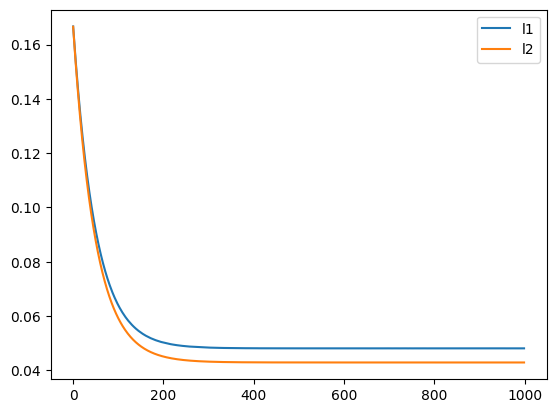

In [78]:
plt.plot(cost_history_l1,label='l1')
plt.plot(cost_history_l2,label='l2')
plt.legend()

In [79]:
# make predictions using l1 regularized weights and reverse min-max scaling
y_pred_test_l1 = np.dot(x_test_scaled, w_l1)
y_pred_test_l1 = y_pred_test_l1 * (y_train_reg.max() - y_train_reg.min()) + y_train_reg.min()

# calculate rmse for l1 model
rmse_l1 = np.sqrt(np.sum((y_pred_test_l1 - y_test_reg) ** 2) / len(y_test_reg))
print(rmse_l1)

# make predictions using l2 regularized weights and reverse min-max scaling
y_pred_test_l2 = np.dot(x_test_scaled, w_l2)
y_pred_test_l2 = y_pred_test_l2 * (y_train_reg.max() - y_train_reg.min()) + y_train_reg.min()

# calculate rmse for l2 model
rmse_l2 = np.sqrt(np.sum((y_pred_test_l2 - y_test_reg) ** 2) / len(y_test_reg))
print(rmse_l2)


2558479.2375507834
2613940.54598704


classification


In [82]:
def sigmoid(x):
  return 1/(1+np.exp(-x))

In [83]:
def compute_loss_class(y,y_pred,w,reg_type=None, lambda_=0.01):
    loss= -np.mean(y*np.log(y_pred)+(1-y)*np.log(1-y_pred))
    # L1 (Lasso) Regularization
    if reg_type == "l1":
        loss += lambda_ * np.sum(np.abs(w))

    # L2 (Ridge) Regularization
    elif reg_type == "l2":
        loss += (lambda_ /2) * np.sum(w ** 2)

    return loss

In [84]:
# compute gradient for logistic regression with optional regularization
def compute_gradient_class(x, y, w, reg_type=None, lambda_=0.01):
    m = len(y)

    # compute predicted probabilities using sigmoid
    y_pred = sigmoid(np.dot(x, w))

    # compute base gradient
    gradient = (1/m) * np.dot(x.T, (y_pred - y))

    # apply l1 regularization if specified
    if reg_type == "l1":
        gradient += lambda_ * np.sign(w)

    # apply l2 regularization if specified
    elif reg_type == "l2":
        gradient += lambda_ * w

    return gradient


In [85]:
# perform gradient descent for logistic regression with optional regularization
def gd(x, y, alpha=0.01, epochs=100, reg_type=None, lambda_=0.01):
    n, m = x.shape

    # initialize weights to zeros
    w = np.zeros(m)

    # store loss values over epochs
    loss_history = []

    for i in range(epochs):
        # compute gradient with regularization if specified
        gradient = compute_gradient_class(x, y, w, reg_type, lambda_)

        # update weights using gradient descent
        w -= alpha * gradient

        # compute loss and store in history
        loss = compute_loss_class(y, sigmoid(np.dot(x, w)), w, reg_type, lambda_)
        loss_history.append(loss)

    return w, loss_history


In [86]:
#5.Training and Evaluation:
w_l1_class,cost_history_l1_class=gd(x_train_scaled,y_train_class,alpha=0.01,epochs=1000,reg_type="l1",lambda_=0.1)
w_l2_class,cost_history_l2_class=gd(x_train_scaled,y_train_class,alpha=0.01,epochs=1000,reg_type="l2",lambda_=0.1)
#Train the model using gradient descent for both regularizations.
#Evaluate the models on the test set using RMSE (Root Mean Squared Error) or another suitable metric.

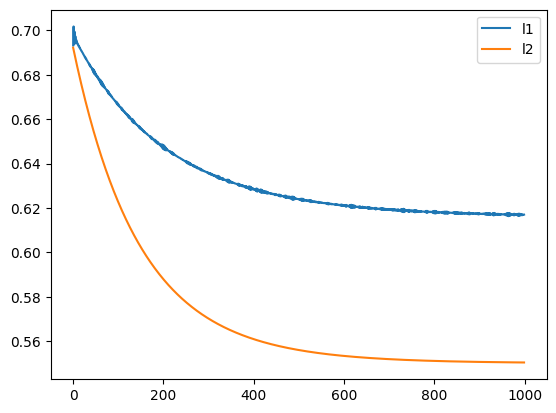

In [87]:
plt.plot(cost_history_l1_class,label='l1')
plt.plot(cost_history_l2_class,label='l2')
plt.legend()

In [88]:
# compute predicted probabilities using sigmoid function
def predict_proba(X, weights):
    z = np.dot(X, weights)
    return sigmoid(z)


In [89]:
# convert predicted probabilities to class labels based on a threshold
def predict_class(X, weights, threshold=0.5):
    probabilities = predict_proba(X, weights)
    return (probabilities >= threshold).astype(int)


In [90]:
y_pred=predict_proba(x_test_scaled,w_l2)

In [91]:
y_pred=predict_class(x_test_scaled,w_l2,0.6)

In [92]:
accuracy = accuracy_score(y_test_class, y_pred)
precision = precision_score(y_test_class, y_pred)
recall = recall_score(y_test_class, y_pred)
f1 = f1_score(y_test_class, y_pred)

print("Accuracy:",accuracy)
print("Precision:",precision)
print("Recall:",recall)
print("F1 Score:",f1)

Accuracy: 0.2206896551724138
Precision: 0.18806509945750452
Recall: 0.9719626168224299
F1 Score: 0.3151515151515151


In [104]:
# calculate quantile loss for a specific quantile
def quantile_loss(y_true, y_pred, q):
    """calculate quantile loss for a specific quantile"""
    errors = y_true - y_pred
    return np.mean(np.maximum(q * errors, (q - 1) * errors))


In [105]:
# compute mse loss for regression using shared and task-specific weights
def regression_loss(X, y, W_shared, W_reg):
    predictions = X @ (W_shared + W_reg)
    return 0.5 * np.mean((predictions - y)**2)


In [106]:
# compute binary cross-entropy loss for classification using shared and task-specific weights
def classification_loss(X, y, W_shared, W_clf):
    logits = X @ (W_shared + W_clf)
    proba = 1 / (1 + np.exp(-logits))
    return -np.mean(y * np.log(proba + 1e-10) + (1 - y) * np.log(1 - proba + 1e-10))


In [107]:
# compute elastic net regularization combining l1 and l2 penalties
def regularization(W, l1_ratio, lambda_):
    L1 = l1_ratio * np.sum(np.abs(W))
    L2 = (1 - l1_ratio) * 0.5 * np.sum(W**2)
    return lambda_ * (L1 + L2)


In [108]:
def multitask_loss(params, X, y_reg, y_clf, alpha, lambda_reg):
    """Loss function with α + β = 1 constraint"""
    n_features = X.shape[1]
    beta = 1 - alpha  # Enforce α + β = 1

    W_shared = params[:n_features]
    W_reg = params[n_features:2*n_features]
    W_clf = params[2*n_features:]

    # Regression loss (price prediction)
    reg_pred = X @ (W_shared + W_reg)
    L_reg = 0.5 * np.mean((reg_pred - y_reg)**2)

    # Classification loss (premium prediction)
    clf_logits = X @ (W_shared + W_clf)
    L_clf = -np.mean(y_clf * np.log(sigmoid(clf_logits) + 1e-10) +
                   (1 - y_clf) * np.log(1 - sigmoid(clf_logits) + 1e-10))

    # L2 regularization
    reg_term = 0.5 * lambda_reg * (np.sum(W_shared**2) + np.sum(W_reg**2) + np.sum(W_clf**2))

    return alpha * L_reg + beta * L_clf + reg_term


In [144]:
def train_model(X_train, y_reg_train, y_clf_train, alpha=0.5, lambda_reg=0.1, l1_ratio=0.5, learning_rate=0.01, max_iters=1000, tol=1e-6):
    """Train with elastic net regularization using custom gradient descent"""
    n_samples, n_features = X_train.shape
    n_params = 3 * n_features  # Shared + regression + classification weights

    # Initialize weights
    params = np.zeros(n_params)
    W_shared = params[:n_features]
    W_reg = params[n_features:2*n_features]
    W_clf = params[2*n_features:]

    # Scale y_reg for better optimization
    y_reg_mean, y_reg_std = np.mean(y_reg_train), np.std(y_reg_train)
    y_reg_scaled = (y_reg_train - y_reg_mean) / y_reg_std

    # Elastic net gradient components
    def elastic_net_grad(W, lambda_reg, l1_ratio):
        l1_grad = lambda_reg * l1_ratio * np.sign(W)
        l2_grad = lambda_reg * (1 - l1_ratio) * W
        return l1_grad + l2_grad

    # Track loss for convergence
    prev_loss = np.inf
    loss_history = []

    for iteration in range(max_iters):
        # Forward pass
        reg_pred = X_train @ (W_shared + W_reg)
        clf_logits = X_train @ (W_shared + W_clf)
        clf_proba = sigmoid(clf_logits)

        # Compute losses
        L_reg = 0.5 * np.mean((reg_pred - y_reg_scaled)**2)
        L_clf = -np.mean(y_clf_train * np.log(clf_proba + 1e-10) +
                      (1 - y_clf_train) * np.log(1 - clf_proba + 1e-10))

        # Compute gradients
        # Regression gradient
        reg_grad = (reg_pred - y_reg_scaled) / n_samples
        grad_reg_shared = X_train.T @ reg_grad
        grad_reg_specific = grad_reg_shared.copy()

        # Classification gradient
        clf_grad = (clf_proba - y_clf_train) / n_samples
        grad_clf_shared = X_train.T @ clf_grad
        grad_clf_specific = grad_clf_shared.copy()

        # Combined gradients with task weights
        grad_shared = alpha * grad_reg_shared + (1 - alpha) * grad_clf_shared
        grad_reg = alpha * grad_reg_specific
        grad_clf = (1 - alpha) * grad_clf_specific

        # Add elastic net regularization gradients
        grad_shared += elastic_net_grad(W_shared, lambda_reg, l1_ratio)
        grad_reg += elastic_net_grad(W_reg, lambda_reg, l1_ratio)
        grad_clf += elastic_net_grad(W_clf, lambda_reg, l1_ratio)

        # Combine all gradients
        gradient = np.concatenate([grad_shared, grad_reg, grad_clf])

        # Update parameters
        params -= learning_rate * gradient

        # Extract updated weights
        W_shared = params[:n_features]
        W_reg = params[n_features:2*n_features]
        W_clf = params[2*n_features:]

        # Compute total loss for convergence check
        current_loss = (alpha * L_reg + (1 - alpha) * L_clf +
                      0.5 * lambda_reg * (l1_ratio * (np.sum(np.abs(W_shared)) + np.sum(np.abs(W_reg)) + np.sum(np.abs(W_clf))) +
                      (1 - l1_ratio) * 0.5 * (np.sum(W_shared**2) + np.sum(W_reg**2) + np.sum(W_clf**2))))

        loss_history.append(current_loss)

        # Check convergence
        if iteration > 0 and abs(prev_loss - current_loss) < tol:
            print(f"Converged after {iteration} iterations")
            break

        prev_loss = current_loss

        # Print progress
        if iteration % 100 == 0:
            print(f"Iteration {iteration}: Loss = {current_loss:.4f}")

    # Rescale regression weights back to original scale
    W_reg = W_reg / y_reg_std
    W_shared = W_shared / y_reg_std
    reg_bias = y_reg_mean - np.mean(X_train @ (W_shared + W_reg))

    return W_shared, W_reg, W_clf, reg_bias, loss_history

In [145]:
# Prediction Functions
def predict_regression(X, W_shared, W_reg):
    return X @ (W_shared + W_reg)

In [100]:
def predict_classification(X, W_shared, W_clf):
    logits = X @ (W_shared + W_clf)
    proba = 1 / (1 + np.exp(-logits))
    return (proba > 0.5).astype(int), proba

In [109]:
def evaluate_with_quantiles(X, W_shared, W_reg, W_clf, reg_bias, y_reg_true, y_clf_true):
    """Evaluate model performance using quantile metrics"""
    # Price predictions
    price_pred = X @ (W_shared + W_reg) + reg_bias

    # Calculate quantile losses for Indian real estate market
    q_losses = {
        'q10': quantile_loss(y_reg_true, price_pred, 0.1),  # Lower price range
        'q50': quantile_loss(y_reg_true, price_pred, 0.5),  # Median price
        'q90': quantile_loss(y_reg_true, price_pred, 0.9)   # Premium segment
    }
    avg_quantile_loss = np.mean(list(q_losses.values()))

    # Premium classification metrics
    premium_proba = sigmoid(X @ (W_shared + W_clf))
    auc = roc_auc_score(y_clf_true, premium_proba)

    return {
        'q_losses': q_losses,
        'avg_quantile_loss': avg_quantile_loss,
        'auc': auc,
        'combined_score': -avg_quantile_loss + auc  # Higher is better
    }


In [134]:
def tune_hyperparameters(X_train, y_reg_train, y_clf_train, X_val, y_reg_val, y_clf_val):
    """Tune hyperparameters using quantile analysis"""
    alpha_values = np.linspace(0.1, 0.9, 5)  # Task weighting
    lambda_values = [0.001, 0.01]      # Regularization strengths
    l1_ratios = [0, 0.5, 1]             # L1 vs L2 mix

    best_score = -np.inf
    best_params = {}
    quantile_results = []

    for alpha in alpha_values:
        for lambda_reg in lambda_values:
            for l1_ratio in l1_ratios:
                print(f"Testing α={alpha:.2f}, λ={lambda_reg}, L1 ratio={l1_ratio}")

                # Train model with current params
                W_shared, W_reg, W_clf, bias,loss_history = train_model(
                    X_train, y_reg_train, y_clf_train,
                    alpha=alpha, lambda_reg=lambda_reg, l1_ratio=l1_ratio
                )

                # Evaluate with quantile metrics
                metrics = evaluate_with_quantiles(
                    X_val, W_shared, W_reg, W_clf, bias,
                    y_reg_val, y_clf_val
                )

                # Store results
                current_result = {
                    'alpha': alpha,
                    'lambda': lambda_reg,
                    'l1_ratio': l1_ratio,
                    **metrics,
                    'weights': (W_shared, W_reg, W_clf, bias)
                }
                quantile_results.append(current_result)

                # Update best params
                if metrics['combined_score'] > best_score:
                    best_score = metrics['combined_score']
                    best_params = current_result

    # Print best parameters based on quantile analysis
    print("\nBest Parameters from Quantile Analysis:")
    print(f"Alpha: {best_params['alpha']:.2f}")
    print(f"Lambda: {best_params['lambda']}")
    print(f"L1 Ratio: {best_params['l1_ratio']}")
    print(f"Average Quantile Loss: {best_params['avg_quantile_loss']:.2f}")
    print(f"Q10 Loss: {best_params['q_losses']['q10']:.2f}")
    print(f"Q50 Loss: {best_params['q_losses']['q50']:.2f}")
    print(f"Q90 Loss: {best_params['q_losses']['q90']:.2f}")
    print(f"Premium AUC: {best_params['auc']:.4f}")

    return best_params, quantile_results


In [146]:
best_params,quantile_results=tune_hyperparameters(x_train_scaled, y_scaled, y_train_class, x_test_scaled, y_test_scaled, y_test_class)

Testing α=0.10, λ=0.001, L1 ratio=0
Iteration 0: Loss = 0.6738
Iteration 100: Loss = 0.5721
Iteration 200: Loss = 0.5315
Iteration 300: Loss = 0.5126
Iteration 400: Loss = 0.5025
Iteration 500: Loss = 0.4962
Iteration 600: Loss = 0.4920
Iteration 700: Loss = 0.4890
Iteration 800: Loss = 0.4867
Iteration 900: Loss = 0.4850
Testing α=0.10, λ=0.001, L1 ratio=0.5
Iteration 0: Loss = 0.6738
Iteration 100: Loss = 0.5729
Iteration 200: Loss = 0.5326
Iteration 300: Loss = 0.5139
Iteration 400: Loss = 0.5039
Iteration 500: Loss = 0.4978
Iteration 600: Loss = 0.4936
Iteration 700: Loss = 0.4907
Iteration 800: Loss = 0.4884
Iteration 900: Loss = 0.4867
Testing α=0.10, λ=0.001, L1 ratio=1
Iteration 0: Loss = 0.6738
Iteration 100: Loss = 0.5737
Iteration 200: Loss = 0.5337
Iteration 300: Loss = 0.5152
Iteration 400: Loss = 0.5052
Iteration 500: Loss = 0.4992
Iteration 600: Loss = 0.4951
Iteration 700: Loss = 0.4922
Iteration 800: Loss = 0.4900
Iteration 900: Loss = 0.4883
Testing α=0.10, λ=0.01, L1

In [147]:
quantile_results

[{'alpha': np.float64(0.1),
  'lambda': 0.001,
  'l1_ratio': 0,
  'q_losses': {'q10': np.float64(0.3148308143461574),
   'q50': np.float64(0.3135106920275396),
   'q90': np.float64(0.3121905697089218)},
  'avg_quantile_loss': np.float64(0.3135106920275396),
  'auc': np.float64(0.47546975953844023),
  'combined_score': np.float64(0.1619590675109006),
  'weights': (array([-1.70945626e+00,  2.54824284e-02,  7.74305565e-02,  5.22544464e-03,
          -1.49552918e-02, -1.08299157e-01,  1.42697451e-02, -2.98089871e-02,
           1.16796477e-01, -5.81877168e-02,  1.18367734e-02, -1.75275281e-03,
           5.52384790e-03, -6.24309638e-02,  2.44242410e-02, -3.70202087e-02,
          -3.27641167e-03, -7.60016141e-02,  3.31021910e-02, -2.23333376e-01,
          -4.15454252e-04, -7.12588125e-02,  1.11717252e-02,  3.31966538e-02,
          -1.49753108e-01, -3.03007671e-02,  6.89149042e-02,  1.22827490e-01,
           5.27389003e-02, -2.47445994e-02, -1.30777807e-01, -1.24848445e-02,
          -6.

In [148]:
W_shared, W_reg, W_clf, bias,loss_history =train_model(x_train_scaled, y_scaled, y_train_class,alpha= 0.1,lambda_reg=0.01,l1_ratio=1)

Iteration 0: Loss = 0.6739
Iteration 100: Loss = 0.5841
Iteration 200: Loss = 0.5483
Iteration 300: Loss = 0.5321
Iteration 400: Loss = 0.5237
Iteration 500: Loss = 0.5188
Iteration 600: Loss = 0.5156
Iteration 700: Loss = 0.5133
Converged after 768 iterations


In [149]:
W_reg

array([ 5.17404964e-01,  3.30577334e-05,  2.21272246e-05, -2.77925028e-04,
        7.32008105e-05, -2.16277266e-04,  3.74039417e-05,  1.78640099e-04,
        1.65755711e-06, -1.93286162e-04, -1.79839240e-04,  6.69649177e-05,
        3.12713215e-05, -3.31656126e-04,  3.24794596e-04,  9.10753387e-05,
       -9.26604019e-05, -5.36845830e-06,  3.08090769e-04, -2.49715394e-04,
       -1.47525001e-04,  7.59651871e-05,  1.83517956e-04,  2.53070206e-04,
       -2.74786487e-04, -7.45429369e-05,  1.29037243e-04,  6.35337315e-05,
       -2.29606382e-04, -3.33429320e-05,  1.76012670e-04,  4.83404440e-05,
       -1.94422523e-04,  6.61167440e-05, -1.82493482e-04,  3.47570965e-05,
        1.17506630e-04,  1.34847029e-04,  1.54086117e-04,  5.04707445e-05,
       -1.39796753e-04,  2.56582841e-04, -2.23571834e-04, -2.20476527e-04,
        1.94468026e-04, -1.58974054e-04,  1.96609569e-05, -2.47034654e-04,
        9.93520637e-06,  6.41275832e-05,  2.66039854e-04, -1.35045150e-04,
       -3.99087151e-04, -

In [150]:
W_clf

array([-6.80638591e-01, -5.75136176e-05, -2.04640511e-05,  5.44970852e-06,
       -8.86661411e-05, -8.07212957e-05,  6.39279060e-05, -1.07769572e-04,
        5.26319617e-03,  3.74115343e-05, -9.92138454e-05, -2.17494561e-05,
       -1.01607249e-04,  1.15191069e-05, -4.95235170e-05, -3.24727392e-05,
       -8.40377805e-05, -1.77466095e-04,  1.32588189e-04, -3.54253328e-02,
        2.06851520e-05, -5.17254295e-05,  8.68131309e-06,  7.82306012e-05,
       -1.05039678e-02,  3.43319181e-05,  1.42003388e-02,  1.49345430e-04,
        7.53936478e-05,  2.73031408e-05, -4.88703235e-03, -8.37226662e-05,
       -9.14452549e-05, -3.55264245e-05,  9.34966070e-05, -1.20181175e-04,
       -6.32352119e-05,  1.73055298e-02, -1.82316016e-05,  1.98904648e-05,
        8.14128871e-05,  3.22928451e-06, -7.87618035e-05,  3.03451727e-05,
       -5.00016348e-05, -3.97514676e-05, -8.21116336e-03, -4.30254202e-05,
        3.82576800e-06,  6.44329544e-05, -8.46464278e-05,  2.26658738e-05,
        6.23463107e-06, -

In [151]:
W_shared

array([-1.54636518e+00, -1.62795945e-04, -4.75599183e-05, -2.59366894e-04,
       -2.28737940e-04, -4.61227766e-02,  2.55100481e-04, -1.88352415e-04,
        2.54164112e-02, -6.58870013e-05,  1.63372331e-04, -7.09947170e-06,
       -3.14736361e-04, -2.92429599e-04,  1.56149963e-04, -1.95055234e-05,
        3.02230898e-04, -6.09701640e-04,  7.85303328e-05, -1.44722587e-01,
       -7.70849340e-05, -1.00177717e-04,  2.13080818e-04,  5.19472350e-04,
       -4.83036549e-02,  4.23690695e-05,  3.00972222e-02,  3.59876886e-02,
        2.71349572e-05,  5.96336667e-05, -6.34597691e-02, -2.36764072e-04,
       -5.05825114e-04, -5.48629683e-05,  1.58004791e-02, -3.09877676e-03,
       -9.78310480e-05,  1.10827372e-01,  9.20012340e-05,  1.18204628e-04,
        1.37442170e-04,  2.67579667e-04,  1.89285984e-04,  5.63928127e-04,
        2.41952367e-05, -2.94341493e-04, -4.42878319e-02,  2.87517859e-04,
        2.29632642e-05,  2.83543987e-04, -2.22103883e-05, -5.78600424e-05,
        3.03212804e-04,  

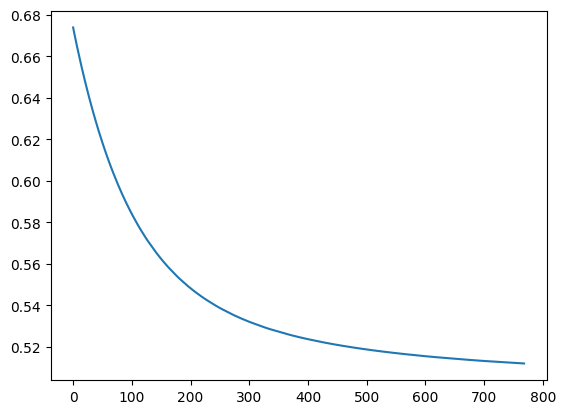

In [152]:
plt.plot(loss_history)

In [191]:
y_pred_reg=x_test_scaled @ (W_shared + W_reg) + bias
y_pred_reg=y_pred_reg*(y_train_reg.max() - y_train_reg.min()) + y_train_reg.min()
rmse_reg=np.sqrt(np.sum((y_pred_reg-y_test_reg)**2)/len(y_test_reg))
r2_reg=r2_score(y_test_reg,y_pred_reg)
print("RMSE: ",rmse_reg)
print("R_squared:",r2_reg)

RMSE:  3500617.7461733255
R_squared: -0.8710471242292681


In [180]:
y_pred_class=predict_proba(x_test_scaled,(W_shared + W_clf))

In [188]:
y_pred_class=predict_class(x_test_scaled,(W_shared + W_clf),0.1)

In [190]:
accuracy = accuracy_score(y_test_class, y_pred_class)
precision = precision_score(y_test_class, y_pred_class)
recall = recall_score(y_test_class, y_pred_class)
f1 = f1_score(y_test_class, y_pred_class)

print("Accuracy:",accuracy)
print("Precision:",precision)
print("Recall:",recall)
print("F1 Score:",f1)

Accuracy: 0.5172413793103449
Precision: 0.18545454545454546
Recall: 0.4766355140186916
F1 Score: 0.2670157068062827


In [173]:
def plot_feature_importance(W_shared, W_reg, W_clf, feature_names, top_n=20):
    """
    Plot feature importance for shared, regression, and classification weights

    Args:
        W_shared: Shared weights vector (n_features,)
        W_reg: Regression-specific weights vector (n_features,)
        W_clf: Classification-specific weights vector (n_features,)
        feature_names: List of feature names
        top_n: Number of top features to display
    """
    plt.figure(figsize=(15, 12))

    # Create importance DataFrame
    importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Shared_Weight': np.abs(W_shared),
        'Regression_Weight': np.abs(W_reg),
        'Classification_Weight': np.abs(W_clf)
    })

    # Normalize importance scores for better comparison
    for col in ['Shared_Weight', 'Regression_Weight', 'Classification_Weight']:
        importance_df[col] = importance_df[col] / importance_df[col].max()

    # Plot Shared Feature Importance
    plt.subplot(3, 1, 1)
    shared_top = importance_df.nlargest(top_n, 'Shared_Weight')
    sns.barplot(x='Shared_Weight', y='Feature', data=shared_top, palette='viridis')
    plt.title(f'Top {top_n} Shared Features (Important for Both Tasks)', fontsize=12)
    plt.xlabel('Normalized Importance Score', fontsize=10)
    plt.ylabel('')

    # Plot Regression Feature Importance (Price Prediction)
    plt.subplot(3, 1, 2)
    reg_top = importance_df.nlargest(top_n, 'Regression_Weight')
    sns.barplot(x='Regression_Weight', y='Feature', data=reg_top, palette='Blues_d')
    plt.title(f'Top {top_n} Price-Specific Features', fontsize=12)
    plt.xlabel('Normalized Importance Score', fontsize=10)
    plt.ylabel('')

    # Plot Classification Feature Importance (Premium Prediction)
    plt.subplot(3, 1, 3)
    clf_top = importance_df.nlargest(top_n, 'Classification_Weight')
    sns.barplot(x='Classification_Weight', y='Feature', data=clf_top, palette='Reds_d')
    plt.title(f'Top {top_n} Premium-Specific Features', fontsize=12)
    plt.xlabel('Normalized Importance Score', fontsize=10)
    plt.ylabel('')

    plt.tight_layout()
    plt.show()

    return importance_df


In [171]:
feature_names=x_train.columns
feature_names

Index(['SchoolProximity', 'HospitalProximity', 'GarageCars', 'BedroomAbvGr',
       'FullBath', 'HalfBath', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF',
       'TotalBsmtSF',
       ...
       'Street_Paved', 'Alley_Paved', 'LotShape_Regular',
       'LotConfig_Cul-de-sac', 'LotConfig_Inside', 'LandSlope_Moderate',
       'LandSlope_Severe', 'BldgType_Townhouse', 'HouseStyle_Two-story',
       'SwimmingPool_Yes'],
      dtype='object', length=104)

<ipython-input-173-033bab3e76d7>:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Shared_Weight', y='Feature', data=shared_top, palette='viridis')
<ipython-input-173-033bab3e76d7>:37: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Regression_Weight', y='Feature', data=reg_top, palette='Blues_d')
<ipython-input-173-033bab3e76d7>:45: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Classification_Weight', y='Feature', data=clf_top, palette='Reds_d')


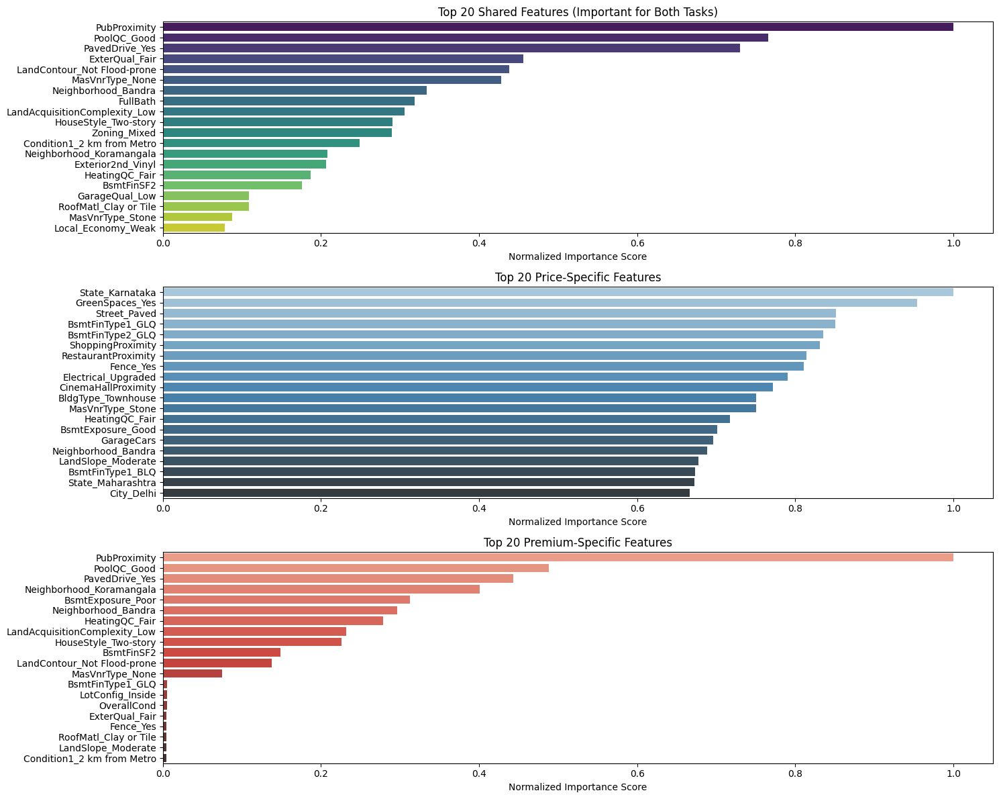

In [175]:
importance_df = plot_feature_importance(W_shared[1:], W_reg[1:], W_clf[1:], feature_names, top_n=20)